In [1]:

import os
import glob
import numpy as np
from PIL import Image
from google.colab import drive

In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:

!pip install pytorch_msssim
!pip install torch==2.3.0 torchvision==0.18.0 torchaudio==2.3.0 --index-url https://download.pytorch.org/whl/cu121
!pip install pytorch-msssim scikit-image matplotlib
!pip install torchmetrics
!pip install seaborn pandas scipy


Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.9/780.9 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 99.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 93.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 81.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 66.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 123.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196

In [4]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
from tqdm import tqdm

In [7]:
import os
import glob
import re
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from torch.cuda.amp import autocast, GradScaler
from pytorch_msssim import SSIM
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

In [30]:

!pip install pytorch_msssim
!pip install torch==2.3.0 torchvision==0.18.0 torchaudio==2.3.0 --index-url https://download.pytorch.org/whl/cu121
!pip install pytorch-msssim scikit-image matplotlib
!pip install torchmetrics
!pip install seaborn pandas scipy

Looking in indexes: https://download.pytorch.org/whl/cu121


In [31]:

import torch
print("CUDA available:", torch.cuda.is_available())
print("GPU name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

CUDA available: True
GPU name: Tesla T4


In [32]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [33]:
import os
local_base_path = '/content/optimaldataset'
gdrive_base_path = '/content/drive/MyDrive/optimaldataset'
# Define dataset paths
splits = {
    'train': os.path.join(local_base_path, 'Train'),
    'validate': os.path.join(local_base_path, 'Validate'),
    'test': os.path.join(local_base_path, 'Test')
}
sigma = 25
image_size = (256, 256)
output_dir = '/content/drive/MyDrive/denoising_samples'
os.makedirs(output_dir, exist_ok=True)

In [34]:

import shutil, os, time

In [35]:

if not os.path.exists(local_base_path):
    print("📂 Copying dataset to local disk...")
    start_time = time.time()
    shutil.copytree(gdrive_base_path, local_base_path)
    print(f"✅ Dataset copied to {local_base_path} in {time.time() - start_time:.2f} seconds")

📂 Copying dataset to local disk...
✅ Dataset copied to /content/optimaldataset in 836.49 seconds


In [36]:
import glob
import os
from PIL import Image

In [37]:
# Verify folder existence and image sizes
for split, path in splits.items():
    if not os.path.exists(path):
        raise FileNotFoundError(f"Folder not found: {path}")
    noisy_path = os.path.join(path, f'noisy_sigma{sigma}')
    if not os.path.exists(noisy_path):
        raise FileNotFoundError(f"Noisy folder not found: {noisy_path}")
    print(f"📂 Found {split} folder: {path}")
    sample_files = glob.glob(os.path.join(noisy_path, '*.png'))
    if sample_files:
        sample_img = Image.open(sample_files[0]).convert('RGB')
        if sample_img.size != image_size:
            raise ValueError(f"Expected 256x256 images, found {sample_img.size} in {noisy_path}")

📂 Found train folder: /content/optimaldataset/Train
📂 Found validate folder: /content/optimaldataset/Validate
📂 Found test folder: /content/optimaldataset/Test


In [38]:
from torch.utils.data import Dataset, DataLoader

In [39]:
# Dataset class
class PairedNoisyCleanDataset(Dataset):
    def __init__(self, base_dir, split, transform=None):
        self.transform = transform
        split_dir = os.path.join(base_dir, split.capitalize())
        noisy_dir = os.path.join(split_dir, f'noisy_sigma{sigma}')
        self.clean_images = []
        for root, _, files in os.walk(split_dir):
            if os.path.abspath(root) == os.path.abspath(noisy_dir):
                continue
            for f in files:
                if f.lower().endswith('.png'):
                    self.clean_images.append(os.path.join(root, f))
        self.noisy_images = [
            os.path.join(noisy_dir, f) for f in os.listdir(noisy_dir)
            if f.lower().endswith('.png')
        ]
        clean_dict = {os.path.basename(p): p for p in self.clean_images}
        noisy_dict = {os.path.basename(p): p for p in self.noisy_images}
        self.matched_clean = []
        self.matched_noisy = []
        for fname in noisy_dict:
            if fname in clean_dict:
                self.matched_clean.append(clean_dict[fname])
                self.matched_noisy.append(noisy_dict[fname])
        print(f"📊 [{split}] Found {len(self.matched_clean)} paired samples")

    def __len__(self):
        return len(self.matched_clean)

    def __getitem__(self, idx):
        noisy_img = Image.open(self.matched_noisy[idx]).convert('RGB')
        clean_img = Image.open(self.matched_clean[idx]).convert('RGB')
        if self.transform:
            seed = torch.randint(0, 2**31, (1,)).item()
            torch.manual_seed(seed)
            noisy_img = self.transform(noisy_img)
            torch.manual_seed(seed)
            clean_img = self.transform(clean_img)
        return noisy_img, clean_img, self.matched_noisy[idx]


In [40]:

from torchvision import transforms

In [41]:
# Transforms
train_transform = transforms.Compose([
    transforms.RandomCrop(256),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ToTensor()
])
val_test_transform = transforms.ToTensor()


In [42]:
# Datasets and DataLoaders
batch_size = 1
accum_steps = 8  # Effective batch size 8
train_dataset = PairedNoisyCleanDataset(local_base_path, 'train', train_transform)
val_dataset = PairedNoisyCleanDataset(local_base_path, 'validate', val_test_transform)
test_dataset = PairedNoisyCleanDataset(local_base_path, 'test', val_test_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)
print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f" Test dataset size: {len(test_dataset)}")

📊 [train] Found 3000 paired samples
📊 [validate] Found 1002 paired samples
📊 [test] Found 1002 paired samples
Train dataset size: 3000
Validation dataset size: 1002
 Test dataset size: 1002


In [44]:

# Verify folder existence and image sizes
for split, path in splits.items():
    if not os.path.exists(path):
        raise FileNotFoundError(f"Folder not found: {path}")
    noisy_path = os.path.join(path, f'noisy_sigma{sigma}')
    if not os.path.exists(noisy_path):
        raise FileNotFoundError(f"Noisy folder not found: {noisy_path}")
    print(f"📂 Found {split} folder: {path}")
    sample_files = glob.glob(os.path.join(noisy_path, '*.png'))
    if sample_files:
        sample_img = Image.open(sample_files[0]).convert('RGB')
        if sample_img.size != image_size:
            raise ValueError(f"Expected 256x256 images, found {sample_img.size} in {noisy_path}")

📂 Found train folder: /content/optimaldataset/Train
📂 Found validate folder: /content/optimaldataset/Validate
📂 Found test folder: /content/optimaldataset/Test


In [45]:
# Dataset class
class PairedNoisyCleanDataset(Dataset):
    def __init__(self, base_dir, split, transform=None):
        self.transform = transform
        split_dir = os.path.join(base_dir, split.capitalize())
        noisy_dir = os.path.join(split_dir, f'noisy_sigma{sigma}')
        self.clean_images = []
        for root, _, files in os.walk(split_dir):
            if os.path.abspath(root) == os.path.abspath(noisy_dir):
                continue
            for f in files:
                if f.lower().endswith('.png'):
                    self.clean_images.append(os.path.join(root, f))
        self.noisy_images = [
            os.path.join(noisy_dir, f) for f in os.listdir(noisy_dir)
            if f.lower().endswith('.png')
        ]
        clean_dict = {os.path.basename(p): p for p in self.clean_images}
        noisy_dict = {os.path.basename(p): p for p in self.noisy_images}
        self.matched_clean = []
        self.matched_noisy = []
        for fname in noisy_dict:
            if fname in clean_dict:
                self.matched_clean.append(clean_dict[fname])
                self.matched_noisy.append(noisy_dict[fname])
        print(f"📊 [{split}] Found {len(self.matched_clean)} paired samples")

    def __len__(self):
        return len(self.matched_clean)

    def __getitem__(self, idx):
        noisy_img = Image.open(self.matched_noisy[idx]).convert('RGB')
        clean_img = Image.open(self.matched_clean[idx]).convert('RGB')
        if self.transform:
            seed = torch.randint(0, 2**31, (1,)).item()
            torch.manual_seed(seed)
            noisy_img = self.transform(noisy_img)
            torch.manual_seed(seed)
            clean_img = self.transform(clean_img)
        return noisy_img, clean_img, self.matched_noisy[idx]



In [46]:

# Transforms
train_transform = transforms.Compose([
    transforms.RandomCrop(256),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ToTensor()
])
val_test_transform = transforms.ToTensor()


In [47]:


# Datasets and DataLoaders
batch_size = 1
accum_steps = 8  # Effective batch size 8
train_dataset = PairedNoisyCleanDataset(local_base_path, 'train', train_transform)
val_dataset = PairedNoisyCleanDataset(local_base_path, 'validate', val_test_transform)
test_dataset = PairedNoisyCleanDataset(local_base_path, 'test', val_test_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)
print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f" Test dataset size: {len(test_dataset)}")


📊 [train] Found 3000 paired samples
📊 [validate] Found 1002 paired samples
📊 [test] Found 1002 paired samples
Train dataset size: 3000
Validation dataset size: 1002
 Test dataset size: 1002


In [48]:

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

In [49]:

# Bi-MSAAE Model (Fixed)
class MultiScaleEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.branch3x3 = nn.Sequential(
            nn.Conv2d(3, 126, kernel_size=3, padding=1, groups=3),
            nn.Conv2d(126, 126, kernel_size=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 126, kernel_size=3, padding=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True)
        )
        self.branch5x5 = nn.Sequential(
            nn.Conv2d(3, 126, kernel_size=5, padding=2, groups=3),
            nn.Conv2d(126, 126, kernel_size=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 126, kernel_size=5, padding=2),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True)
        )
        self.residual = nn.Conv2d(3, 252, kernel_size=1)
        self.checkpoint_segments = 2  # For gradient checkpointing

    def forward(self, x):
        if self.training:
            f1 = checkpoint_sequential(self.branch3x3, self.checkpoint_segments, x)
            f2 = checkpoint_sequential(self.branch5x5, self.checkpoint_segments, x)
        else:
            f1 = self.branch3x3(x)
            f2 = self.branch5x5(x)
        res = self.residual(x)
        return torch.cat([f1, f2], dim=1) + res

class NoiseGateModule(nn.Module):
    def __init__(self, in_channels=252):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        mask = self.conv(x)
        mask = self.sigmoid(mask)
        return x * mask

class ChannelAttentionBlock(nn.Module):
    def __init__(self, in_channels=252):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.conv = nn.Conv2d(in_channels * 2, in_channels, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.avg_pool(x)
        max_out = self.max_pool(x)
        pooled = torch.cat([avg_out, max_out], dim=1)
        attn = self.conv(pooled)
        attn = self.sigmoid(attn)
        return x * attn

class DualHeadDecoder(nn.Module):
    def __init__(self, in_channels=252):
        super().__init__()
        self.structural_head = nn.Sequential(
            nn.Conv2d(in_channels, 126, kernel_size=3, padding=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 63, kernel_size=3, padding=1),
            nn.BatchNorm2d(63),
            nn.ReLU(inplace=True),
            nn.Conv2d(63, 33, kernel_size=3, padding=1),
            nn.BatchNorm2d(33),
            nn.ReLU(inplace=True),
            nn.Conv2d(33, 15, kernel_size=3, padding=1),
            nn.BatchNorm2d(15),
            nn.ReLU(inplace=True),
            nn.Conv2d(15, 3, kernel_size=3, padding=1),
            nn.BatchNorm2d(3)
        )
        self.texture_head = nn.Sequential(
            nn.Conv2d(in_channels, 126, kernel_size=5, padding=2),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 63, kernel_size=5, padding=2),
            nn.BatchNorm2d(63),
            nn.ReLU(inplace=True),
            nn.Conv2d(63, 33, kernel_size=5, padding=2),
            nn.BatchNorm2d(33),
            nn.ReLU(inplace=True),
            nn.Conv2d(33, 15, kernel_size=5, padding=2),
            nn.BatchNorm2d(15),
            nn.ReLU(inplace=True),
            nn.Conv2d(15, 3, kernel_size=5, padding=2),
            nn.BatchNorm2d(3)
        )
        self.alpha = nn.Parameter(torch.tensor(0.6))
        self.checkpoint_segments = 2

    def forward(self, x):
        if self.training:
            struct = checkpoint_sequential(self.structural_head, self.checkpoint_segments, x)
            text = checkpoint_sequential(self.texture_head, self.checkpoint_segments, x)
        else:
            struct = self.structural_head(x)
            text = self.texture_head(x)
        return self.alpha * struct + (1 - self.alpha) * text

class SharpeningModule(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(3, 3, kernel_size=3, padding=1, bias=False)
        laplacian = torch.tensor([[[[0, -1, 0], [-1, 4, -1], [0, -1, 0]]]], dtype=torch.float32)
        laplacian = laplacian.repeat(3, 3, 1, 1)
        self.conv.weight = nn.Parameter(laplacian)
        self.strength = nn.Parameter(torch.tensor(0.7))

    def forward(self, x):
        edges = self.conv(x)
        return x + self.strength * edges

class BiMSAAE(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = MultiScaleEncoder()
        self.noise_gate = NoiseGateModule()
        self.attention = ChannelAttentionBlock()
        self.decoder = DualHeadDecoder()
        self.sharpen = SharpeningModule()
        self.skip_conv = nn.Conv2d(252, 252, kernel_size=1)

    def forward(self, x):
        f = self.encoder(x)
        skip = self.skip_conv(f)
        f = self.noise_gate(f)
        f = self.attention(f)
        f = f + skip
        out = self.decoder(f)
        out = torch.sigmoid(out)
        out = self.sharpen(out)
        return torch.clamp(out, 0, 1)


In [50]:

# Edge Loss
class EdgeLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.sobel_x = torch.tensor([[[[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]]], dtype=torch.float32).repeat(3, 1, 1, 1)
        self.sobel_y = torch.tensor([[[[-1, -2, -1], [0, 0, 0], [1, 2, 1]]]], dtype=torch.float32).repeat(3, 1, 1, 1)
        self.mse = nn.MSELoss()

    def forward(self, output, target):
        self.sobel_x = self.sobel_x.to(output.device)
        self.sobel_y = self.sobel_y.to(output.device)
        grad_x_out = F.conv2d(output, self.sobel_x, groups=3)
        grad_y_out = F.conv2d(output, self.sobel_y, groups=3)
        grad_x_tgt = F.conv2d(target, self.sobel_x, groups=3)
        grad_y_tgt = F.conv2d(target, self.sobel_y, groups=3)
        return self.mse(grad_x_out, grad_x_tgt) + self.mse(grad_y_out, grad_y_tgt)


In [51]:

# Simplified Perceptual Loss
class PerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg16(pretrained=True).features[:9].eval()  # Up to conv3_3
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg
        self.mse = nn.MSELoss()

    def forward(self, output, target):
        output_vgg = self.vgg(output)
        target_vgg = self.vgg(target)
        return self.mse(output_vgg, target_vgg)

In [52]:


# Training function
def train_model(model, train_loader, val_loader, mse_criterion, perceptual_criterion, ssim_criterion, edge_criterion, optimizer, scheduler, device, num_epochs, warmup_epochs=5, accum_steps=8):
    model.to(device)
    scaler = GradScaler('cuda')
    best_psnr = 0.0
    best_model_path = '/content/drive/MyDrive/bi_msaae_model_sigma15_256x256_best.pth'
    for epoch in range(num_epochs):
        start_time = time.time()
        model.train()
        train_loss = 0.0
        lr = optimizer.param_groups[0]['lr']
        if epoch < warmup_epochs:
            lr_factor = (epoch + 1) / warmup_epochs
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr * lr_factor
        optimizer.zero_grad()
        for i, (noisy, clean, _) in enumerate(train_loader):
            noisy, clean = noisy.to(device), clean.to(device)
            with autocast(device_type='cuda'):
                outputs = model(noisy)
                mse_loss = mse_criterion(outputs, clean)
                perceptual_loss = perceptual_criterion(outputs, clean)
                ssim_loss = 1 - ssim_criterion(outputs, clean)
                edge_loss = edge_criterion(outputs, clean)
                loss = 0.5 * mse_loss + 0.3 * perceptual_loss + 0.1 * ssim_loss + 0.1 * edge_loss
                loss = loss / accum_steps
            scaler.scale(loss).backward()
            if (i + 1) % accum_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            train_loss += loss.item() * accum_steps * noisy.size(0)
            torch.cuda.empty_cache()
        model.eval()
        val_loss, psnr_val, ssim_val = 0.0, 0.0, 0.0
        with torch.no_grad():
            for noisy, clean, _ in val_loader:
                noisy, clean = noisy.to(device), clean.to(device)
                with autocast(device_type='cuda'):
                    outputs = model(noisy)
                    mse_loss = mse_criterion(outputs, clean)
                    perceptual_loss = perceptual_criterion(outputs, clean)
                    ssim_loss = 1 - ssim_criterion(outputs, clean)
                    edge_loss = edge_criterion(outputs, clean)
                    loss = 0.5 * mse_loss + 0.3 * perceptual_loss + 0.1 * ssim_loss + 0.1 * edge_loss
                val_loss += loss.item() * noisy.size(0)
                outputs_np = outputs.cpu().numpy()
                clean_np = clean.cpu().numpy()
                for i in range(outputs_np.shape[0]):
                    psnr_channels = [
                        peak_signal_noise_ratio(clean_np[i, c], outputs_np[i, c], data_range=1.0)
                        for c in range(3)
                    ]
                    ssim_channels = [
                        structural_similarity(clean_np[i, c], outputs_np[i, c], data_range=1.0, win_size=7)
                        for c in range(3)
                    ]
                    psnr_val += sum(psnr_channels) / 3
                    ssim_val += sum(ssim_channels) / 3
        val_loss /= len(val_dataset)
        psnr_val /= len(val_dataset)
        ssim_val /= len(val_dataset)
        avg_train_loss = train_loss / len(train_dataset)
        epoch_time = time.time() - start_time
        current_lr = optimizer.param_groups[0]['lr']
        if epoch >= warmup_epochs:
            scheduler.step()
        print(f"\r\033[96mEpoch {epoch+1}/{num_epochs} [{100*(epoch+1)/num_epochs:.1f}%]\033[0m")
        print(f"🌟 Train Loss: {avg_train_loss:.6f} | Val Loss: {val_loss:.6f} | PSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f} | Time: {epoch_time:.2f}s | LR: {current_lr:.6e}")
        if (epoch + 1) % 5 == 0:
            checkpoint_path = f'/content/drive/MyDrive/bi_msaae_model_sigma15_256x256_epoch{epoch+1}.pth'
            torch.save(model.state_dict(), checkpoint_path)
            print(f"💾 Checkpoint saved to {checkpoint_path}")
        if psnr_val > best_psnr:
            best_psnr = psnr_val
            torch.save(model.state_dict(), best_model_path)
            print(f"🏆 New best model saved to {best_model_path} (PSNR: {psnr_val:.2f})")
        if psnr_val > 33 and ssim_val > 0.92 and epoch >= 20:
            print(f"🎯 Target metrics achieved at epoch {epoch+1}. Stopping training.")
            break
        torch.cuda.empty_cache()

In [53]:
import torchvision
from torchvision import models

In [54]:

from pytorch_msssim import SSIM

In [55]:
# Device and setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = BiMSAAE().to(device)
mse_criterion = nn.MSELoss()
perceptual_criterion = PerceptualLoss().to(device)
ssim_criterion = SSIM(data_range=1.0, channel=3, win_size=7).to(device)
edge_criterion = EdgeLoss().to(device)
optimizer = optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=95)
num_epochs = 100

In [56]:


from torch.utils.checkpoint import checkpoint_sequential

In [57]:

import os
import glob
import re

# === Step 1: Define the checkpoint directory ===
drive_checkpoint_dir = '/content/drive/MyDrive/bimsaae_newcheckpointscolored25/'

# === Step 2: Collect all checkpoint files ===
checkpoint_paths = glob.glob(os.path.join(drive_checkpoint_dir, 'bimsaae_epoch_*.pth'))

# === Step 3: Define helper function to extract epoch number ===
def get_epoch(path):
    match = re.search(r'bimsaae_epoch_(\d+)\.pth', path)
    return int(match.group(1)) if match else -1

# === Step 4: Sort checkpoints numerically ===
checkpoint_paths = sorted(checkpoint_paths, key=get_epoch)

# === Step 5: Get latest checkpoint ===
if checkpoint_paths:
    latest_checkpoint = checkpoint_paths[-1]
    start_epoch = get_epoch(latest_checkpoint)

    print("✅ Latest checkpoint:", latest_checkpoint)
    print("🔁 Resuming from epoch:", start_epoch)
else:
    print("⚠️ No checkpoints found in:", drive_checkpoint_dir)

⚠️ No checkpoints found in: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/


In [58]:

print("Checkpoint paths:", checkpoint_paths)
print("Starting from epoch:", start_epoch)

Checkpoint paths: []
Starting from epoch: 0


In [59]:

import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [61]:

import torch
print(torch.cuda.is_available())

True


In [64]:

import torch
import os
import glob
from torch.cuda.amp import autocast, GradScaler

# ==== Device setup ====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Using device: {device}")

# ==== Model, optimizer, criterion ====
model = BiMSAAE().to(device)  # move to GPU right away

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.MSELoss()

# ==== Checkpoints setup ====
drive_checkpoint_dir = '/content/drive/MyDrive/bimsaae_newcheckpointscolored25/'
os.makedirs(drive_checkpoint_dir, exist_ok=True)

checkpoint_paths = sorted(
    glob.glob(os.path.join(drive_checkpoint_dir, 'bimsaae_epoch_*.pth')),
    key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])
)

# ==== Resume logic ====
start_epoch = 0
if checkpoint_paths:
    latest_checkpoint = checkpoint_paths[-1]
    print(f"🔁 Resuming from checkpoint: {latest_checkpoint}")
    # Always map checkpoint to the current device (GPU if available)
    checkpoint = torch.load(latest_checkpoint, map_location=device)
    model.load_state_dict(checkpoint)
    start_epoch = int(os.path.basename(latest_checkpoint).split('_')[-1].split('.')[0])
    print(f"✅ Successfully loaded checkpoint. Starting from epoch {start_epoch+1}")
else:
    print("🚀 No checkpoint found. Starting training from scratch.")

# ==== Training setup ====
num_epochs = 50  # total epochs you want
scaler = GradScaler()  # mixed precision scaler (GPU only)

# ==== Training loop ====
for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0

    for i, (noisy, clean, _) in enumerate(train_loader):
        noisy, clean = noisy.to(device, non_blocking=True), clean.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        with autocast():  # mixed precision context
            output = model(noisy)
            loss = criterion(output, clean)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"📘 Epoch {epoch+1}/{num_epochs} | Loss: {avg_loss:.6f}")

    # Save checkpoint every epoch
    checkpoint_path = os.path.join(drive_checkpoint_dir, f'bimsaae_epoch_{epoch+1}.pth')
    torch.save(model.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")

✅ Using device: cuda
🚀 No checkpoint found. Starting training from scratch.
📘 Epoch 1/50 | Loss: 0.023904
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_1.pth
📘 Epoch 2/50 | Loss: 0.014410
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_2.pth
📘 Epoch 3/50 | Loss: 0.011782
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_3.pth
📘 Epoch 4/50 | Loss: 0.009993
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_4.pth
📘 Epoch 5/50 | Loss: 0.008488
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_5.pth
📘 Epoch 6/50 | Loss: 0.007470
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_6.pth
📘 Epoch 7/50 | Loss: 0.006580
💾 Saved checkpoint: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_epoch_7.pth
📘 Epoch 8/50 | Loss: 0.005834
💾 Saved checkpoint:

In [65]:
final_model_path = os.path.join(drive_checkpoint_dir, 'bimsaae_final.pth')
torch.save(model.state_dict(), final_model_path)
print(f"Final model saved to: {final_model_path}")

Final model saved to: /content/drive/MyDrive/bimsaae_newcheckpointscolored25/bimsaae_final.pth


In [66]:

!pip install torchmetrics

In [67]:

# Simplified Perceptual Loss
class PerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg16(pretrained=True).features[:9].eval()  # Up to conv3_3
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg.to(dtype=torch.float32)  # Ensure VGG is in float32
        self.mse = nn.MSELoss()

    def forward(self, output, target):
        # Ensure inputs are float32
        output = output.to(dtype=torch.float32)
        target = target.to(dtype=torch.float32)
        output_vgg = self.vgg(output)
        target_vgg = self.vgg(target)
        return self.mse(output_vgg, target_vgg)

In [70]:
# Test evaluation and visualization
model.eval()
test_loss, inference_times = 0.0, []
psnr_noisy_clean, psnr_noisy_denoised, psnr_clean_denoised = [], [], []
ssim_noisy_clean, ssim_noisy_denoised, ssim_clean_denoised = [], [], []
sample_images = []
num_samples = 15


In [71]:
import torch
from torch.cuda.amp import autocast, GradScaler

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
noisy = noisy.to(device)

scaler = GradScaler()

# Correct usage — NO device_type
with autocast():
    denoised = model(noisy)


Displaying Sample 1 (03296.png)


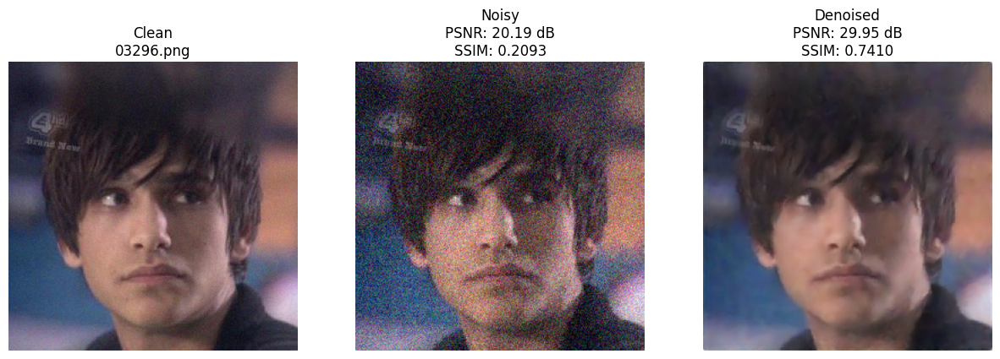


Displaying Sample 2 (03045.png)


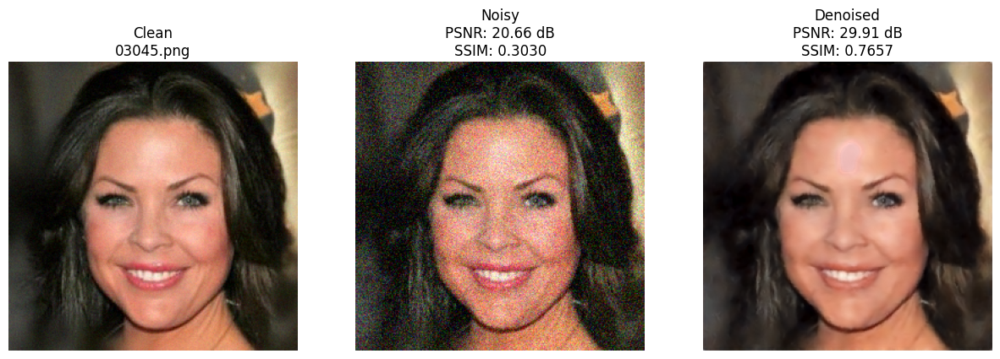


Displaying Sample 3 (03337.png)


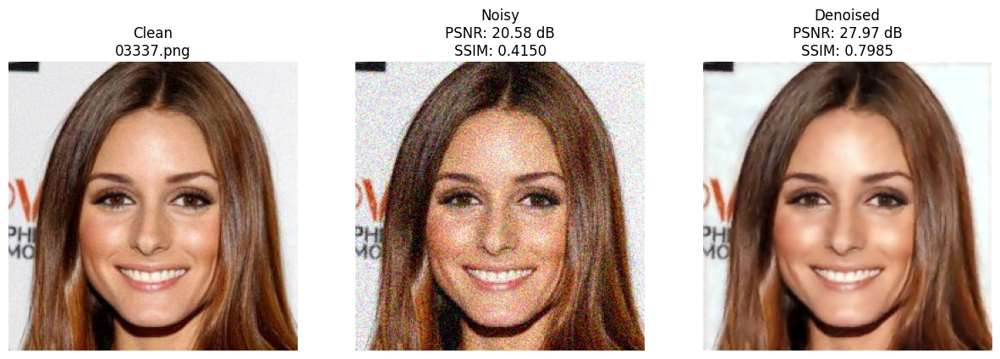


Displaying Sample 4 (03280.png)


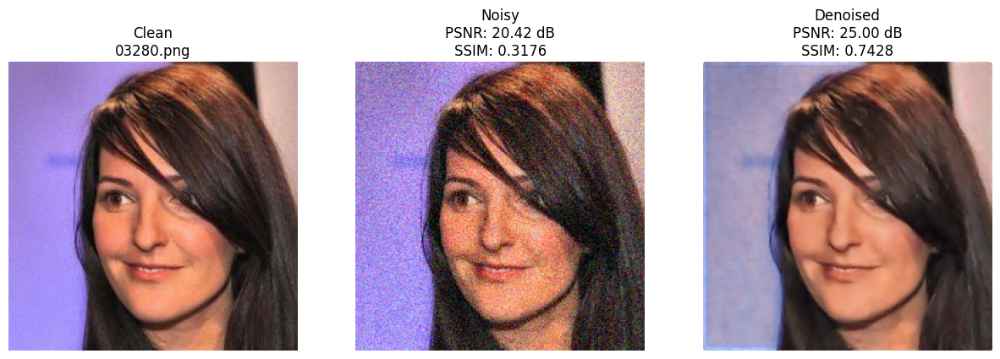


Displaying Sample 5 (03843.png)


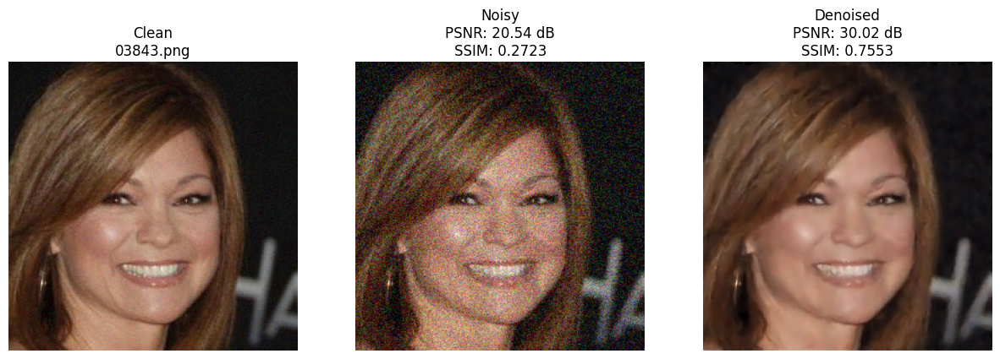


Displaying Sample 6 (03805.png)


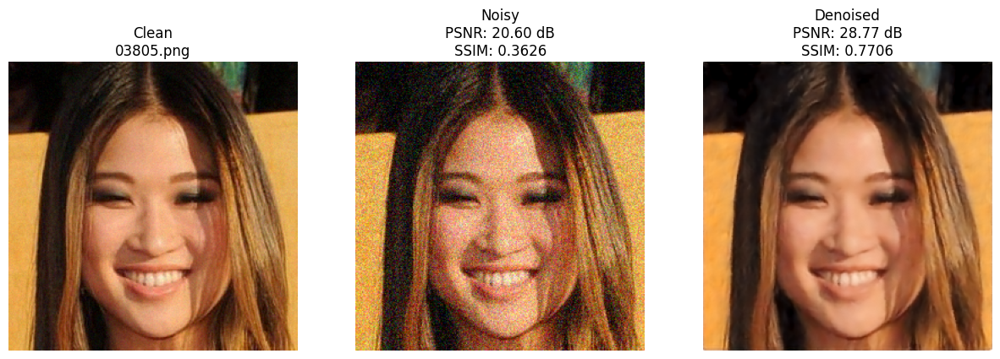


Displaying Sample 7 (03321.png)


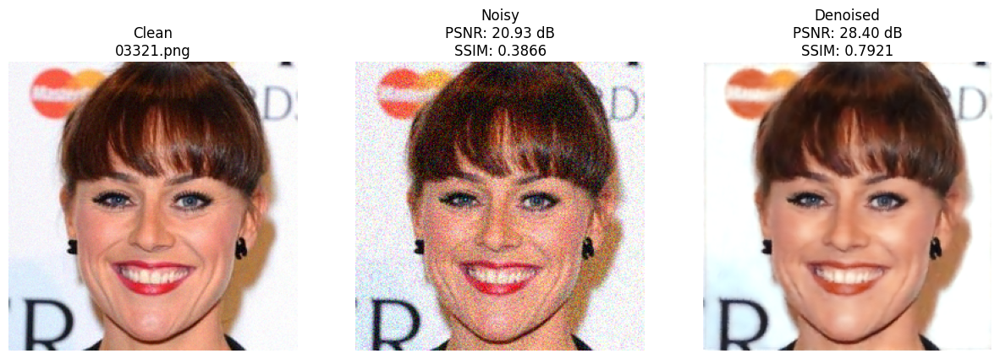


Displaying Sample 8 (03435.png)


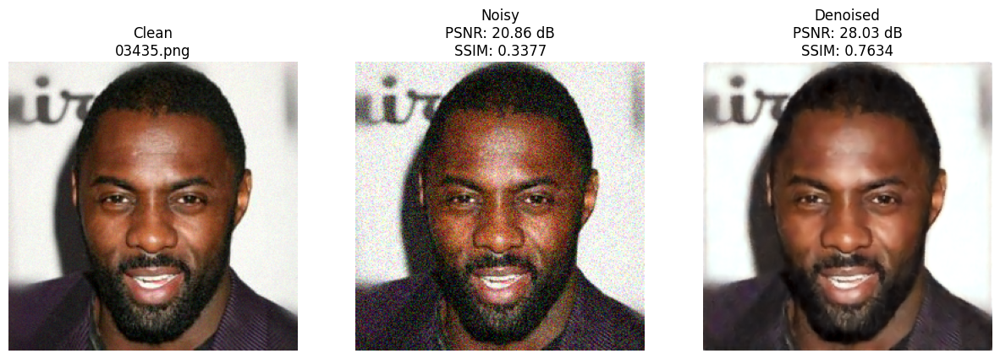


Displaying Sample 9 (03902.png)


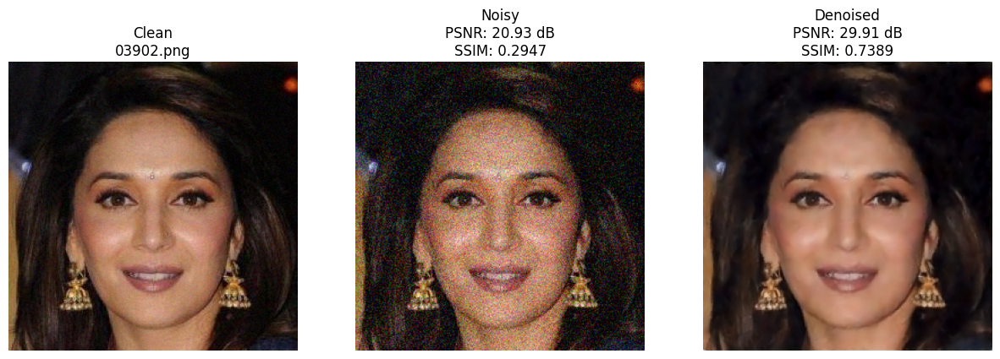


Displaying Sample 10 (03567.png)


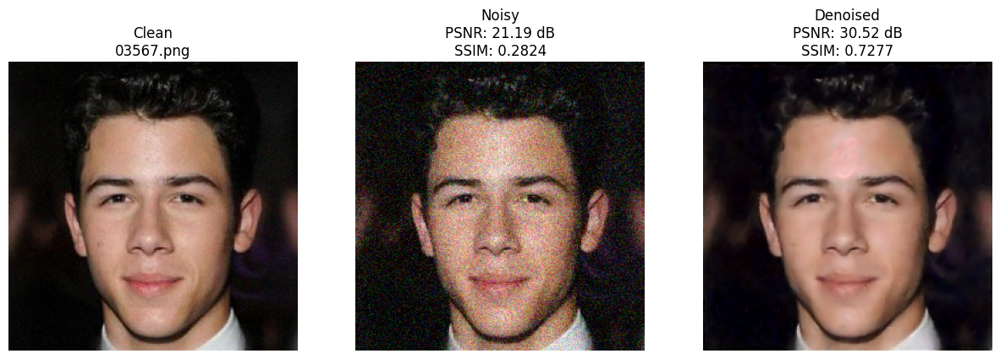


Average test loss over 10 samples: 0.099624


In [72]:
import torch
import random
import os
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image as IPyImage, display
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from torch.cuda.amp import autocast
import torch.nn.functional as F
import time  # Make sure time is imported

# ==== Parameters ====
num_samples = 10  # visualize 10 test samples
output_dir = "./sample_outputs"
os.makedirs(output_dir, exist_ok=True)

# ==== Storage for metrics ====
sample_images = []
inference_times = []
psnr_noisy_clean, psnr_noisy_denoised, psnr_clean_denoised = [], [], []
ssim_noisy_clean, ssim_noisy_denoised, ssim_clean_denoised = [], [], []
test_loss = 0.0

# ==== Switch model to eval mode ====
model.eval()

# ==== Collect random test samples ====
with torch.no_grad():
    test_samples = random.sample(list(test_dataset), min(num_samples, len(test_dataset)))

    for idx, (noisy, clean, noisy_path) in enumerate(test_samples):
        noisy, clean = noisy.unsqueeze(0).to(device), clean.unsqueeze(0).to(device)

        # Run inference in mixed precision
        start_time = time.time()
        with autocast():  # mixed precision
            denoised = model(noisy)
        inference_times.append((time.time() - start_time) * 1000)  # in ms

        # Ensure float32 for loss calculations
        denoised = denoised.to(dtype=torch.float32)
        clean = clean.to(dtype=torch.float32)

        # Compute losses
        mse_loss_val = mse_criterion(denoised, clean)
        perceptual_loss_val = perceptual_criterion(denoised, clean)
        ssim_loss_val = 1 - ssim_criterion(denoised, clean)
        edge_loss_val = edge_criterion(denoised, clean)
        loss = 0.5 * mse_loss_val + 0.3 * perceptual_loss_val + 0.1 * ssim_loss_val + 0.1 * edge_loss_val
        test_loss += loss.item()

        # Convert to NumPy for visualization and metrics
        noisy_np = np.clip(noisy.cpu().numpy()[0].transpose(1, 2, 0), 0, 1).astype(np.float32)
        clean_np = np.clip(clean.cpu().numpy()[0].transpose(1, 2, 0), 0, 1).astype(np.float32)
        denoised_np = np.clip(denoised.cpu().numpy()[0].transpose(1, 2, 0), 0, 1).astype(np.float32)
        sample_images.append((clean_np, noisy_np, denoised_np, os.path.basename(noisy_path)))

        # Compute PSNR and SSIM per channel
        psnr_nc = np.mean([peak_signal_noise_ratio(clean_np[:, :, c], noisy_np[:, :, c], data_range=1.0) for c in range(3)])
        psnr_nd = np.mean([peak_signal_noise_ratio(noisy_np[:, :, c], denoised_np[:, :, c], data_range=1.0) for c in range(3)])
        psnr_cd = np.mean([peak_signal_noise_ratio(clean_np[:, :, c], denoised_np[:, :, c], data_range=1.0) for c in range(3)])
        ssim_nc = np.mean([structural_similarity(clean_np[:, :, c], noisy_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)])
        ssim_nd = np.mean([structural_similarity(noisy_np[:, :, c], denoised_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)])
        ssim_cd = np.mean([structural_similarity(clean_np[:, :, c], denoised_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)])

        # Save metrics
        psnr_noisy_clean.append(psnr_nc)
        psnr_noisy_denoised.append(psnr_nd)
        psnr_clean_denoised.append(psnr_cd)
        ssim_noisy_clean.append(ssim_nc)
        ssim_noisy_denoised.append(ssim_nd)
        ssim_clean_denoised.append(ssim_cd)

        # Plot triplet
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 3, 1)
        plt.imshow(clean_np)
        plt.title(f"Clean\n{os.path.basename(noisy_path)}")
        plt.axis('off')
        plt.subplot(1, 3, 2)
        plt.imshow(noisy_np)
        plt.title(f"Noisy\nPSNR: {psnr_nc:.2f} dB\nSSIM: {ssim_nc:.4f}")
        plt.axis('off')
        plt.subplot(1, 3, 3)
        plt.imshow(denoised_np)
        plt.title(f"Denoised\nPSNR: {psnr_cd:.2f} dB\nSSIM: {ssim_cd:.4f}")
        plt.axis('off')

        # Save figure
        sample_path = os.path.join(output_dir, f'sample_{idx+1}.png')
        plt.savefig(sample_path, format='png', dpi=100, bbox_inches='tight')
        plt.close()

        # Display in Colab
        print(f"\nDisplaying Sample {idx+1} ({os.path.basename(noisy_path)})")
        display(IPyImage(filename=sample_path))

        # Free GPU memory
        torch.cuda.empty_cache()

print(f"\nAverage test loss over {num_samples} samples: {test_loss/num_samples:.6f}")

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import os
from PIL import Image
from IPython.display import display
sns.set_style("whitegrid")

In [74]:

# ==== Step 1: Collect Per-Channel Metrics (if not already) ====
psnr_per_channel = []
ssim_per_channel = []
for i in range(len(sample_images)):
    clean_np, noisy_np, denoised_np, _ = sample_images[i]
    psnr_ch = [peak_signal_noise_ratio(clean_np[:, :, c], denoised_np[:, :, c], data_range=1.0) for c in range(3)]
    ssim_ch = [structural_similarity(clean_np[:, :, c], denoised_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)]
    psnr_per_channel.append(psnr_ch)
    ssim_per_channel.append(ssim_ch)

In [75]:

# ==== Step 2: Aggregate Statistics ====
num_samples = len(psnr_noisy_clean)
samples = np.arange(1, num_samples + 1)

In [76]:
# Aggregates
agg_psnr_noisy = np.mean(psnr_noisy_clean)
agg_psnr_denoised = np.mean(psnr_clean_denoised)
agg_ssim_noisy = np.mean(ssim_noisy_clean)
agg_ssim_denoised = np.mean(ssim_clean_denoised)
agg_psnr_improv = agg_psnr_denoised - agg_psnr_noisy
agg_ssim_improv = agg_ssim_denoised - agg_ssim_noisy
agg_inf_time = np.mean(inference_times)

In [77]:

# Std devs
std_psnr_denoised = np.std(psnr_clean_denoised)
std_ssim_denoised = np.std(ssim_clean_denoised)

In [78]:
# Other metrics (e.g., MSE from losses if available, or compute)
mse_values = []  # If you have losses, use; else recompute
for i in range(num_samples):
    clean_np, noisy_np, denoised_np, _ = sample_images[i]
    mse_ch = np.mean([(clean_np[:, :, c] - denoised_np[:, :, c]) ** 2 for c in range(3)])
    mse_values.append(mse_ch)
agg_mse = np.mean(mse_values)

print("🏆 Aggregate Results (Over {} Samples)".format(num_samples))
print(f"  PSNR (Noisy vs Clean): {agg_psnr_noisy:.2f} ± {np.std(psnr_noisy_clean):.2f} dB")
print(f"  PSNR (Denoised vs Clean): {agg_psnr_denoised:.2f} ± {std_psnr_denoised:.2f} dB")
print(f"  SSIM (Noisy vs Clean): {agg_ssim_noisy:.4f} ± {np.std(ssim_noisy_clean):.4f}")
print(f"  SSIM (Denoised vs Clean): {agg_ssim_denoised:.4f} ± {std_ssim_denoised:.4f}")
print(f"  MSE (Denoised vs Clean): {agg_mse:.6f}")
print(f"  PSNR Improvement: +{agg_psnr_improv:.2f} dB")
print(f"  SSIM Improvement: +{agg_ssim_improv:.4f}")
print(f"  Avg Inference Time: {agg_inf_time:.2f} ms")
print(f"  Avg Test Loss: {test_loss / num_samples:.6f}")

🏆 Aggregate Results (Over 10 Samples)
  PSNR (Noisy vs Clean): 20.69 ± 0.28 dB
  PSNR (Denoised vs Clean): 28.85 ± 1.55 dB
  SSIM (Noisy vs Clean): 0.3181 ± 0.0570
  SSIM (Denoised vs Clean): 0.7596 ± 0.0220
  MSE (Denoised vs Clean): 0.001520
  PSNR Improvement: +8.16 dB
  SSIM Improvement: +0.4415
  Avg Inference Time: 9.39 ms
  Avg Test Loss: 0.099624


In [79]:
# ==== Step 3: Create Comprehensive DataFrame/Table ====
df = pd.DataFrame({
    'Sample': samples,
    'PSNR_Noisy_Clean (dB)': psnr_noisy_clean,
    'PSNR_Denoised_Clean (dB)': psnr_clean_denoised,
    'SSIM_Noisy_Clean': ssim_noisy_clean,
    'SSIM_Denoised_Clean': ssim_clean_denoised,
    'PSNR_Noisy_Denoised (dB)': psnr_noisy_denoised,
    'SSIM_Noisy_Denoised': ssim_noisy_denoised,
    'PSNR_Improvement (dB)': np.array(psnr_clean_denoised) - np.array(psnr_noisy_clean),
    'SSIM_Improvement': np.array(ssim_clean_denoised) - np.array(ssim_noisy_clean),
    'MSE_Denoised_Clean': mse_values,
    'Inference_Time (ms)': inference_times
})

In [80]:

# Add per-channel columns (average for table)
df['PSNR_R'] = [ch[0] for ch in psnr_per_channel]
df['PSNR_G'] = [ch[1] for ch in psnr_per_channel]
df['PSNR_B'] = [ch[2] for ch in psnr_per_channel]
df['SSIM_R'] = [ch[0] for ch in ssim_per_channel]
df['SSIM_G'] = [ch[1] for ch in ssim_per_channel]
df['SSIM_B'] = [ch[2] for ch in ssim_per_channel]


In [81]:

import pandas as pd

# ==== Collect metrics into a DataFrame ====
df = pd.DataFrame({
    "PSNR Noisy-Clean": psnr_noisy_clean,
    "PSNR Noisy-Denoised": psnr_noisy_denoised,
    "PSNR Clean-Denoised": psnr_clean_denoised,
    "SSIM Noisy-Clean": ssim_noisy_clean,
    "SSIM Noisy-Denoised": ssim_noisy_denoised,
    "SSIM Clean-Denoised": ssim_clean_denoised
})

# ==== Display first 10 samples (or fewer if dataset < 10) ====
num_preview = min(10, len(df))
print(f"\n📋 Metrics Table Preview (first {num_preview} samples):")
print(df.head(num_preview).round(11))


📋 Metrics Table Preview (first 10 samples):
   PSNR Noisy-Clean  PSNR Noisy-Denoised  PSNR Clean-Denoised  \
0         20.193064            20.481376            29.947556   
1         20.656429            21.011322            29.906408   
2         20.578460            20.687540            27.971598   
3         20.423728            19.760836            25.003321   
4         20.535373            20.929153            30.020628   
5         20.600981            20.861741            28.765613   
6         20.933206            20.918936            28.398248   
7         20.855900            20.723277            28.034698   
8         20.926660            21.305690            29.905808   
9         21.191211            21.583634            30.523275   

   SSIM Noisy-Clean  SSIM Noisy-Denoised  SSIM Clean-Denoised  
0          0.209288             0.238371             0.740963  
1          0.303010             0.325917             0.765690  
2          0.414981             0.428814       

In [82]:

# ==== Step 4: Generate Multiple Graphs (High-Res for Paper) ====
graph_dir = os.path.join(output_dir, 'graphs')
os.makedirs(graph_dir, exist_ok=True)
dpi = 300  # High-res

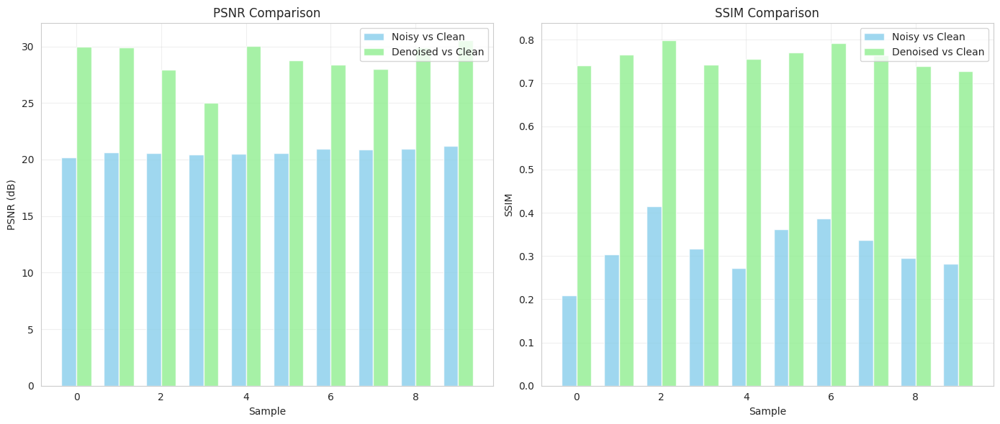

In [83]:

# Graph 1: Bar Comparison (PSNR & SSIM)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
x = np.arange(num_samples)
width = 0.35
ax1.bar(x - width/2, psnr_noisy_clean, width, label='Noisy vs Clean', color='skyblue', alpha=0.8)
ax1.bar(x + width/2, psnr_clean_denoised, width, label='Denoised vs Clean', color='lightgreen', alpha=0.8)
ax1.set_xlabel('Sample')
ax1.set_ylabel('PSNR (dB)')
ax1.set_title('PSNR Comparison')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.bar(x - width/2, ssim_noisy_clean, width, label='Noisy vs Clean', color='skyblue', alpha=0.8)
ax2.bar(x + width/2, ssim_clean_denoised, width, label='Denoised vs Clean', color='lightgreen', alpha=0.8)
ax2.set_xlabel('Sample')
ax2.set_ylabel('SSIM')
ax2.set_title('SSIM Comparison')
ax2.legend()
ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(graph_dir, 'bar_psnr_ssim.png'), dpi=dpi, bbox_inches='tight')
plt.show()


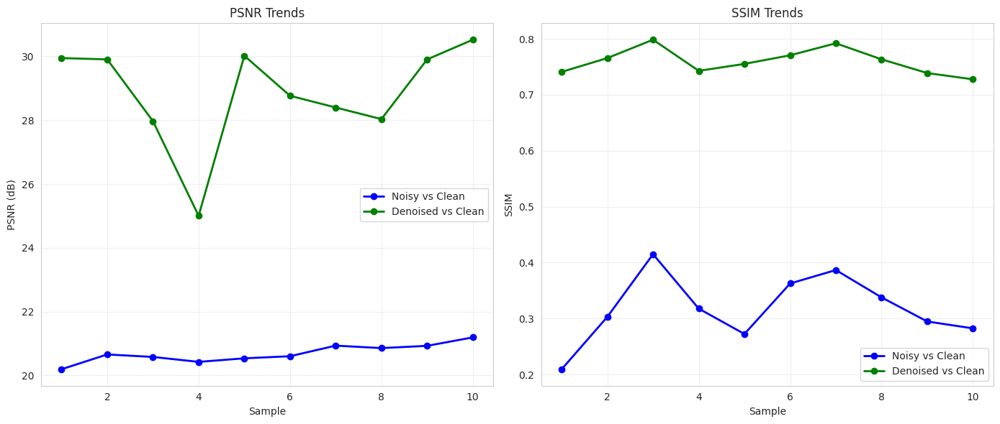

In [84]:

# Graph 2: Line Trends Over Samples
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
ax1.plot(samples, psnr_noisy_clean, 'o-', label='Noisy vs Clean', color='blue', linewidth=2)
ax1.plot(samples, psnr_clean_denoised, 'o-', label='Denoised vs Clean', color='green', linewidth=2)
ax1.set_xlabel('Sample')
ax1.set_ylabel('PSNR (dB)')
ax1.set_title('PSNR Trends')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(samples, ssim_noisy_clean, 'o-', label='Noisy vs Clean', color='blue', linewidth=2)
ax2.plot(samples, ssim_clean_denoised, 'o-', label='Denoised vs Clean', color='green', linewidth=2)
ax2.set_xlabel('Sample')
ax2.set_ylabel('SSIM')
ax2.set_title('SSIM Trends')
ax2.legend()
ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(graph_dir, 'line_trends.png'), dpi=dpi, bbox_inches='tight')
plt.show()

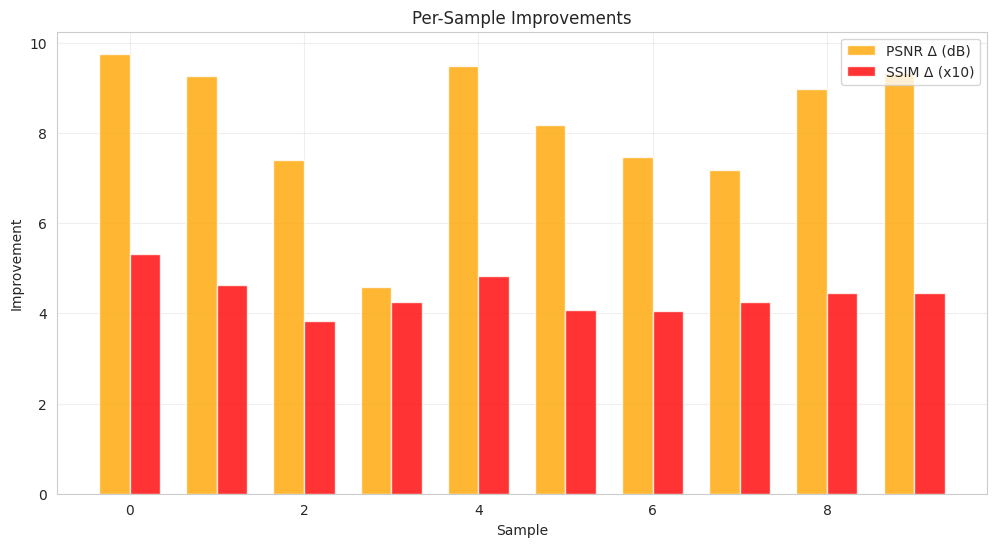

In [85]:

# Graph 5: Improvement Bars
improvements_psnr = np.array(psnr_clean_denoised) - np.array(psnr_noisy_clean)
improvements_ssim = np.array(ssim_clean_denoised) - np.array(ssim_noisy_clean)
fig, ax = plt.subplots(figsize=(12, 6))
x = np.arange(num_samples)
width = 0.35
ax.bar(x - width/2, improvements_psnr, width, label='PSNR Δ (dB)', color='orange', alpha=0.8)
ax.bar(x + width/2, improvements_ssim * 10, width, label='SSIM Δ (x10)', color='red', alpha=0.8)  # Scale SSIM for visibility
ax.set_xlabel('Sample')
ax.set_ylabel('Improvement')
ax.set_title('Per-Sample Improvements')
ax.legend()
ax.grid(True, alpha=0.3)
plt.savefig(os.path.join(graph_dir, 'improvements.png'), dpi=dpi, bbox_inches='tight')
plt.show()

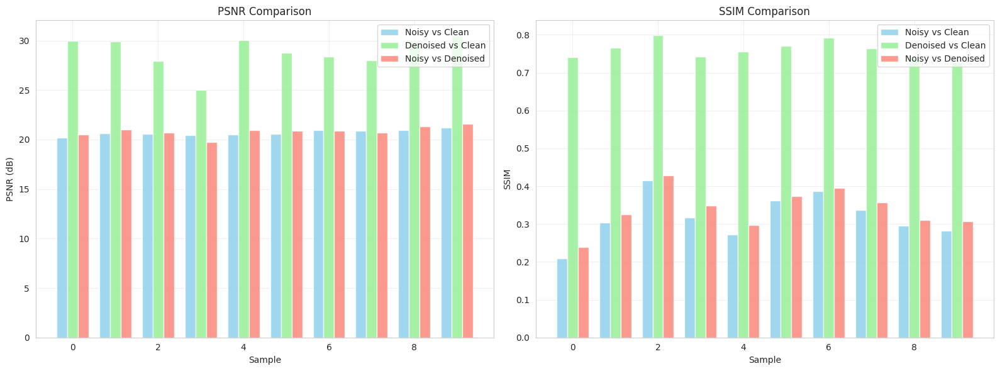

In [87]:

# ==== Graph 1: Bar Comparison (PSNR & SSIM) with Clean vs Denoised ====
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
x = np.arange(num_samples)
width = 0.25  # smaller width to fit three bars

# PSNR comparison
ax1.bar(x - width, psnr_noisy_clean, width, label='Noisy vs Clean', color='skyblue', alpha=0.8)
ax1.bar(x, psnr_clean_denoised, width, label='Denoised vs Clean', color='lightgreen', alpha=0.8)
ax1.bar(x + width, psnr_noisy_denoised, width, label='Noisy vs Denoised', color='salmon', alpha=0.8)
ax1.set_xlabel('Sample')
ax1.set_ylabel('PSNR (dB)')
ax1.set_title('PSNR Comparison')
ax1.legend()
ax1.grid(True, alpha=0.3)

# SSIM comparison
ax2.bar(x - width, ssim_noisy_clean, width, label='Noisy vs Clean', color='skyblue', alpha=0.8)
ax2.bar(x, ssim_clean_denoised, width, label='Denoised vs Clean', color='lightgreen', alpha=0.8)
ax2.bar(x + width, ssim_noisy_denoised, width, label='Noisy vs Denoised', color='salmon', alpha=0.8)
ax2.set_xlabel('Sample')
ax2.set_ylabel('SSIM')
ax2.set_title('SSIM Comparison')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(graph_dir, 'bar_psnr_ssim_triplet.png'), dpi=dpi, bbox_inches='tight')
plt.show()

In [88]:
# ==== Full dataset evaluation ====
model.eval()
sample_images = []  # optional if you want to store some images
psnr_noisy_clean, psnr_clean_denoised, psnr_noisy_denoised = [], [], []
ssim_noisy_clean, ssim_clean_denoised, ssim_noisy_denoised = [], [], []
mse_values = []
inference_times = []
test_loss = 0.0

with torch.no_grad():
    for idx, (noisy, clean, noisy_path) in enumerate(test_dataset):
        noisy, clean = noisy.unsqueeze(0).to(device), clean.unsqueeze(0).to(device)

        # Inference
        start_time = time.time()
        with autocast():
            denoised = model(noisy)
        inference_times.append((time.time() - start_time) * 1000)

        denoised = denoised.to(torch.float32)
        clean = clean.to(torch.float32)

        # Compute losses
        mse_loss_val = mse_criterion(denoised, clean)
        perceptual_loss_val = perceptual_criterion(denoised, clean)
        ssim_loss_val = 1 - ssim_criterion(denoised, clean)
        edge_loss_val = edge_criterion(denoised, clean)
        loss = 0.5 * mse_loss_val + 0.3 * perceptual_loss_val + 0.1 * ssim_loss_val + 0.1 * edge_loss_val
        test_loss += loss.item()

        # Convert to NumPy for metrics
        noisy_np = np.clip(noisy.cpu().numpy()[0].transpose(1, 2, 0), 0, 1)
        clean_np = np.clip(clean.cpu().numpy()[0].transpose(1, 2, 0), 0, 1)
        denoised_np = np.clip(denoised.cpu().numpy()[0].transpose(1, 2, 0), 0, 1)

        # PSNR
        psnr_noisy_clean.append(np.mean([peak_signal_noise_ratio(clean_np[:, :, c], noisy_np[:, :, c], data_range=1.0) for c in range(3)]))
        psnr_clean_denoised.append(np.mean([peak_signal_noise_ratio(clean_np[:, :, c], denoised_np[:, :, c], data_range=1.0) for c in range(3)]))
        psnr_noisy_denoised.append(np.mean([peak_signal_noise_ratio(noisy_np[:, :, c], denoised_np[:, :, c], data_range=1.0) for c in range(3)]))

        # SSIM
        ssim_noisy_clean.append(np.mean([structural_similarity(clean_np[:, :, c], noisy_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)]))
        ssim_clean_denoised.append(np.mean([structural_similarity(clean_np[:, :, c], denoised_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)]))
        ssim_noisy_denoised.append(np.mean([structural_similarity(noisy_np[:, :, c], denoised_np[:, :, c], data_range=1.0, win_size=7) for c in range(3)]))

        # MSE
        mse_values.append(np.mean([(clean_np[:, :, c] - denoised_np[:, :, c]) ** 2 for c in range(3)]))

        torch.cuda.empty_cache()  # free memory if needed

# ==== Aggregate metrics ====
agg_psnr_noisy = np.mean(psnr_noisy_clean)
agg_psnr_denoised = np.mean(psnr_clean_denoised)
agg_psnr_improv = agg_psnr_denoised - agg_psnr_noisy

agg_ssim_noisy = np.mean(ssim_noisy_clean)
agg_ssim_denoised = np.mean(ssim_clean_denoised)
agg_ssim_improv = agg_ssim_denoised - agg_ssim_noisy

agg_mse = np.mean(mse_values)
agg_inf_time = np.mean(inference_times)

print("🏆 Aggregate Results (Full Test Dataset)")
print(f"  PSNR (Noisy vs Clean): {agg_psnr_noisy:.2f} ± {np.std(psnr_noisy_clean):.2f} dB")
print(f"  PSNR (Denoised vs Clean): {agg_psnr_denoised:.2f} ± {np.std(psnr_clean_denoised):.2f} dB")
print(f"  SSIM (Noisy vs Clean): {agg_ssim_noisy:.4f} ± {np.std(ssim_noisy_clean):.4f}")
print(f"  SSIM (Denoised vs Clean): {agg_ssim_denoised:.4f} ± {np.std(ssim_clean_denoised):.4f}")
print(f"  MSE (Denoised vs Clean): {agg_mse:.6f}")
print(f"  PSNR Improvement: +{agg_psnr_improv:.2f} dB")
print(f"  SSIM Improvement: +{agg_ssim_improv:.4f}")
print(f"  Avg Inference Time: {agg_inf_time:.2f} ms")
print(f"  Avg Test Loss: {test_loss / len(test_dataset):.6f}")

🏆 Aggregate Results (Full Test Dataset)
  PSNR (Noisy vs Clean): 20.53 ± 0.31 dB
  PSNR (Denoised vs Clean): 29.01 ± 1.16 dB
  SSIM (Noisy vs Clean): 0.3216 ± 0.0490
  SSIM (Denoised vs Clean): 0.7648 ± 0.0270
  MSE (Denoised vs Clean): 0.001343
  PSNR Improvement: +8.48 dB
  SSIM Improvement: +0.4432
  Avg Inference Time: 6.22 ms
  Avg Test Loss: 0.100072


In [90]:
import pandas as pd

# ==== Collect metrics into a DataFrame ====
df = pd.DataFrame({
    "PSNR Noisy-Clean": psnr_noisy_clean,
    "PSNR Noisy-Denoised": psnr_noisy_denoised,
    "PSNR Clean-Denoised": psnr_clean_denoised,
    "SSIM Noisy-Clean": ssim_noisy_clean,
    "SSIM Noisy-Denoised": ssim_noisy_denoised,
    "SSIM Clean-Denoised": ssim_clean_denoised
})

# ==== Display first 10 samples (or fewer if dataset < 10) ====
num_preview = min(30, len(df))
print(f"\n📋 Metrics Table Preview (first {num_preview} samples):")
print(df.head(num_preview).round(11))


📋 Metrics Table Preview (first 30 samples):
    PSNR Noisy-Clean  PSNR Noisy-Denoised  PSNR Clean-Denoised  \
0          20.719079            20.863487            28.556594   
1          20.160440            20.363035            28.787622   
2          20.226443            20.545045            29.432776   
3          21.055781            21.343791            28.848730   
4          20.560372            20.905918            30.283479   
5          20.346863            20.530603            29.296678   
6          20.389032            20.705360            29.015662   
7          20.347887            20.477102            28.232294   
8          20.278283            20.577993            27.621605   
9          20.699306            20.779888            29.013521   
10         20.430972            20.157675            26.983364   
11         20.841391            21.210626            29.720724   
12         20.328086            20.666981            30.189439   
13         20.781759           